In [1]:
import mne
import numpy as np
import scipy
import os
from scipy import signal as sg
from matplotlib import pyplot as plt

In [2]:
directory_path = "D:/EEG RESEARCH DATA"
os.chdir(directory_path)

In [53]:
# fpath = 'epoch_data'
fpath = 'hep_asr'
# fpath = 'hep_ica_all'

epoch_stress = []
for i in os.listdir(fpath):
    if i.endswith('-stress-epo.fif'):
        epoch_stress.append(os.path.join(fpath,i))

epoch_first_rest = []
for i in os.listdir(fpath):
    if i.endswith('-first-epo.fif'):
        epoch_first_rest.append(os.path.join(fpath,i))

In [59]:
epochs_stress_list =[mne.read_epochs(file) for file in epoch_stress]

epochs_first_rest_list =[mne.read_epochs(file) for file in epoch_first_rest]

Reading D:\EEG RESEARCH DATA\hep_asr\20231019_B68_stroop5mins_0001-asr-stress-epo.fif ...
    Found the data of interest:
        t =    -200.00 ...     600.00 ms
        0 CTF compensation matrices available
Not setting metadata
323 matching events found
No baseline correction applied
0 projection items activated
Reading D:\EEG RESEARCH DATA\hep_asr\20240129_B71_mat5mins_0001-asr-stress-epo.fif ...
    Found the data of interest:
        t =    -200.00 ...     600.00 ms
        0 CTF compensation matrices available
Not setting metadata
69 matching events found
No baseline correction applied
0 projection items activated
Reading D:\EEG RESEARCH DATA\hep_asr\20240418_B98_jikken_0001-asr-stress-epo.fif ...
    Found the data of interest:
        t =    -200.00 ...     600.00 ms
        0 CTF compensation matrices available
Not setting metadata
269 matching events found
No baseline correction applied
0 projection items activated
Reading D:\EEG RESEARCH DATA\hep_asr\20240418_B98_jikken_0002

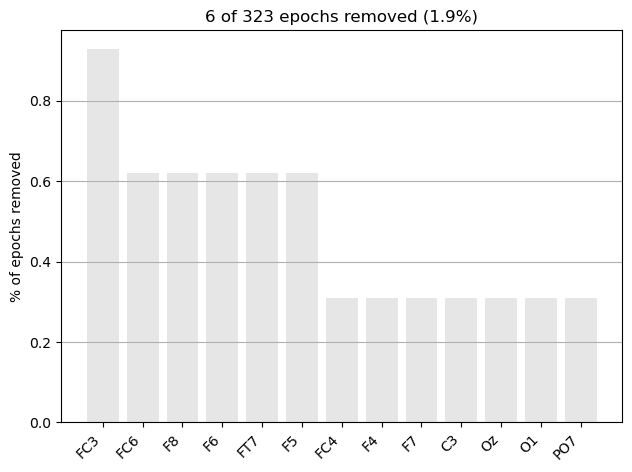

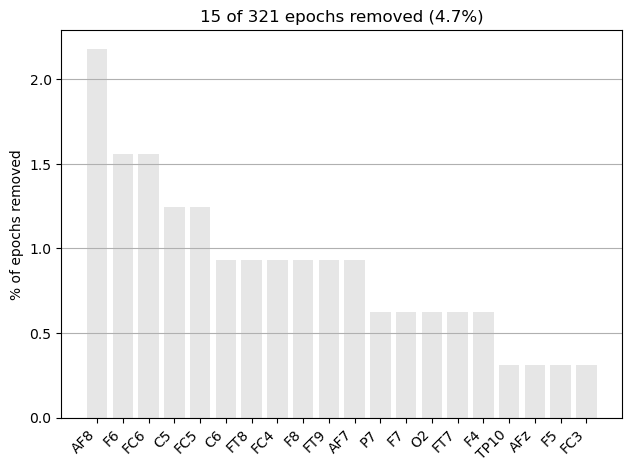

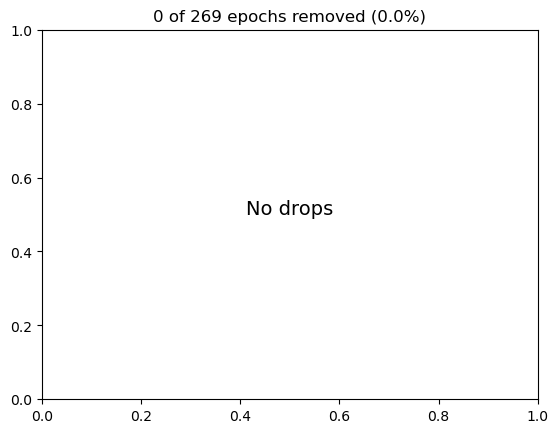

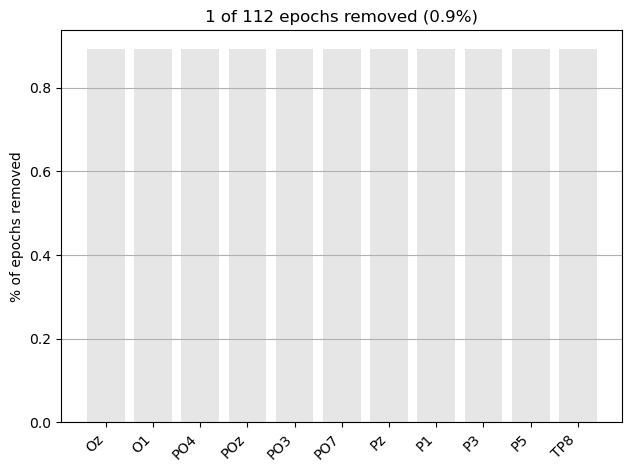

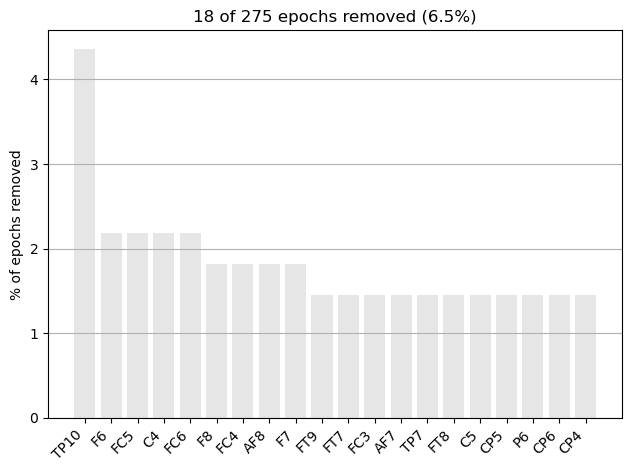

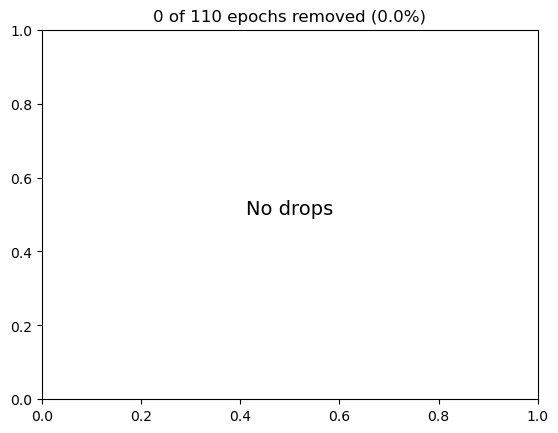

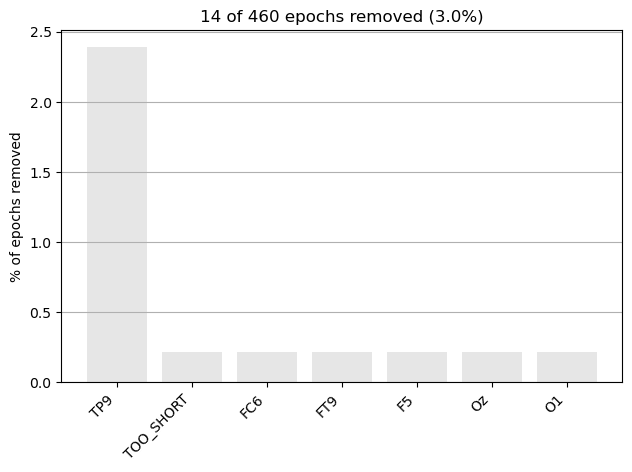

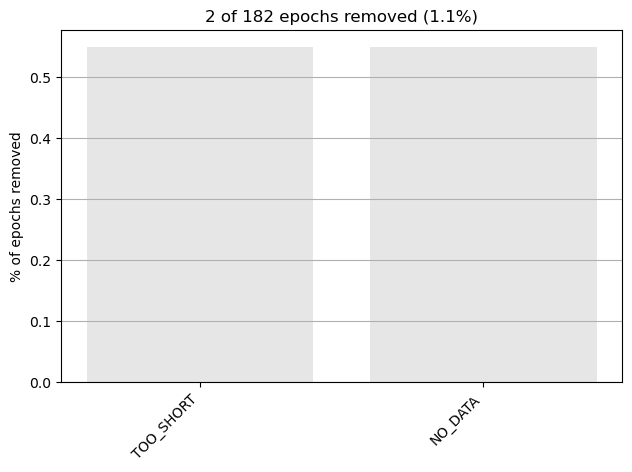

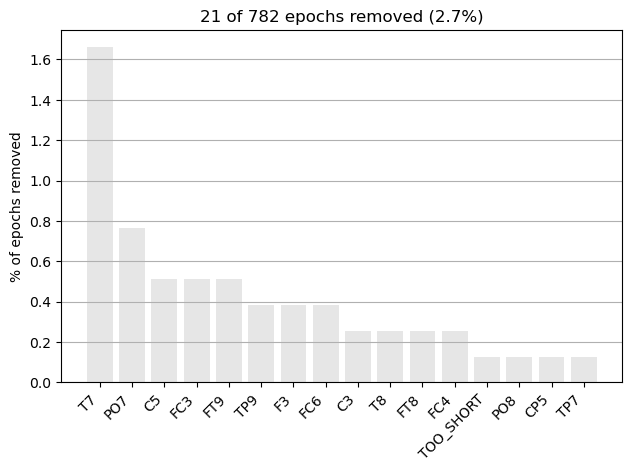

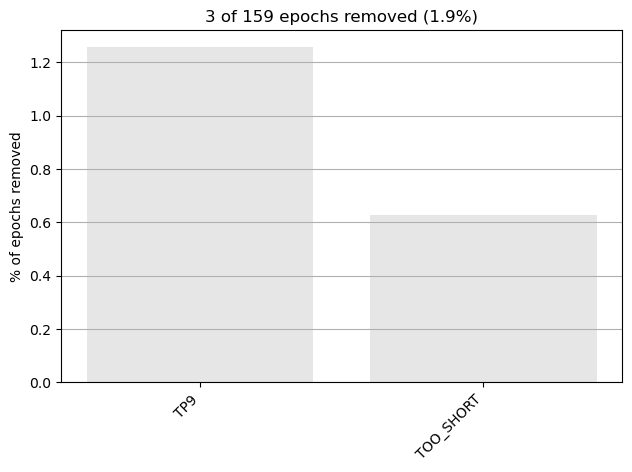

In [42]:
for i in epochs_stress_list:
    i.plot_drop_log()

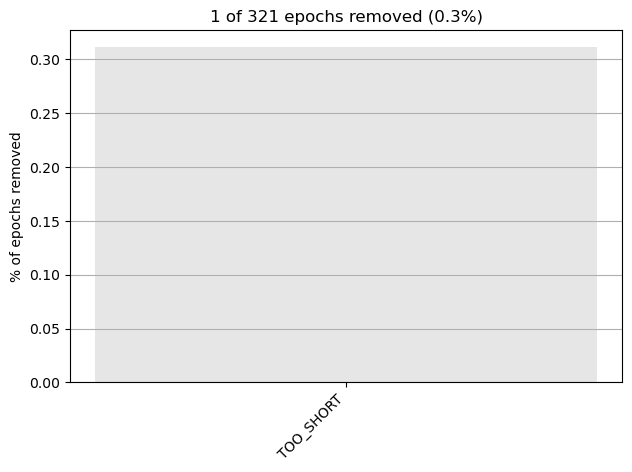

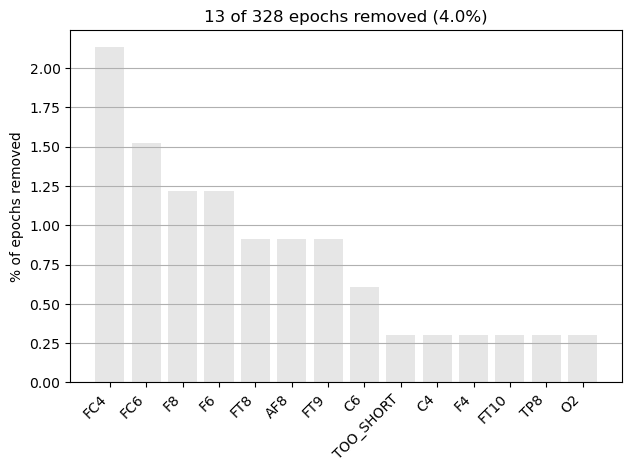

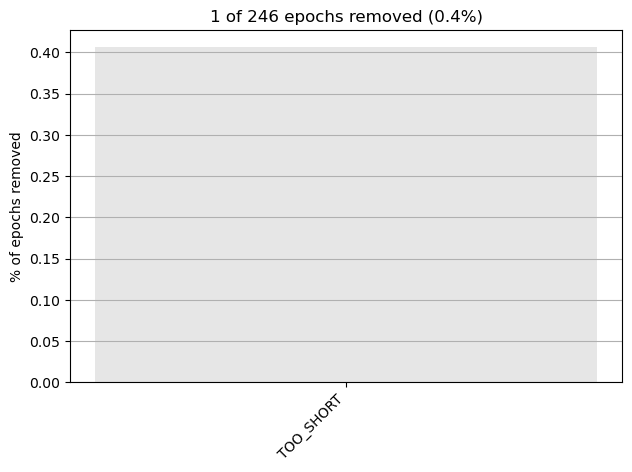

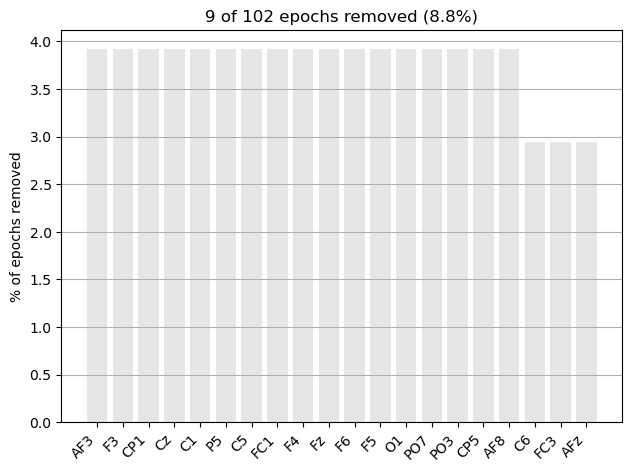

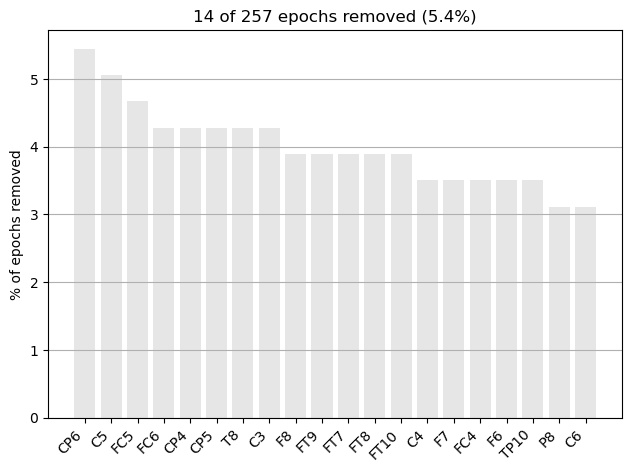

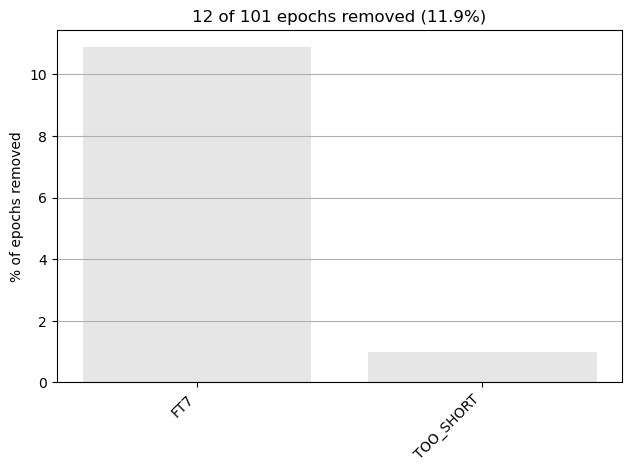

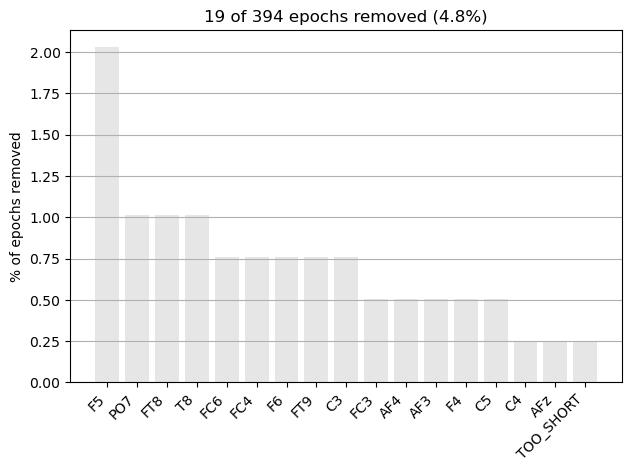

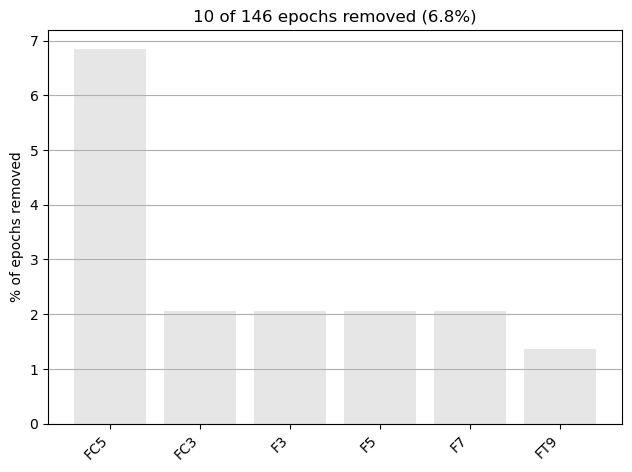

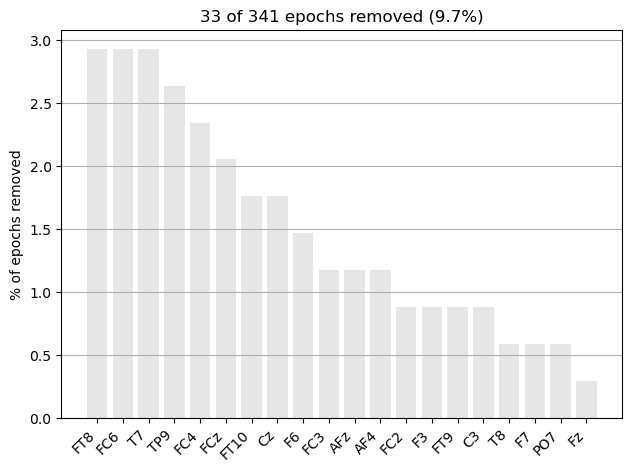

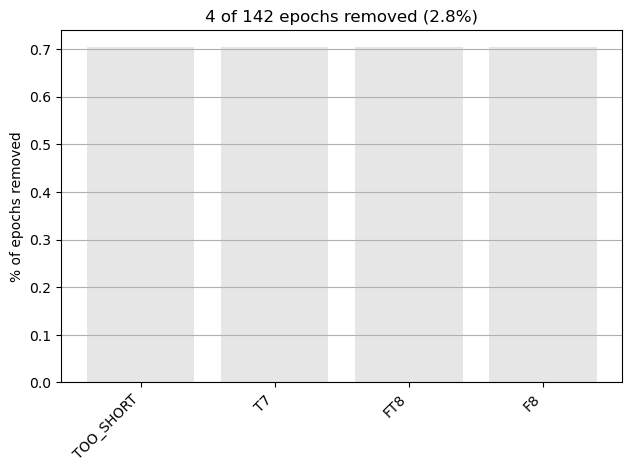

In [41]:
for i in epochs_first_rest_list:
    i.plot_drop_log()

In [60]:
evoked_stress = [epo.average() for epo in epochs_stress_list]
evoked_first_rest = [epo.average() for epo in epochs_first_rest_list]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy functi

Identifying common channels ...
Identifying common channels ...


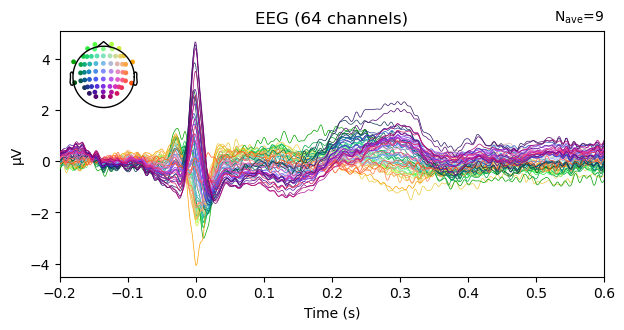

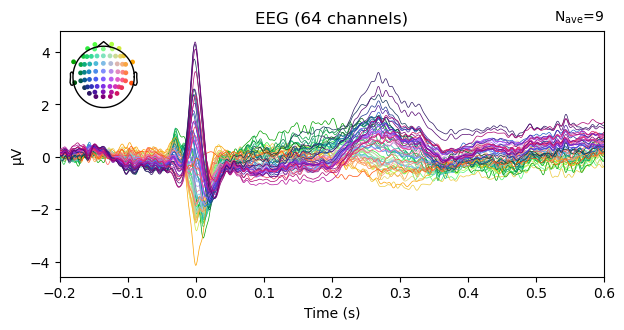

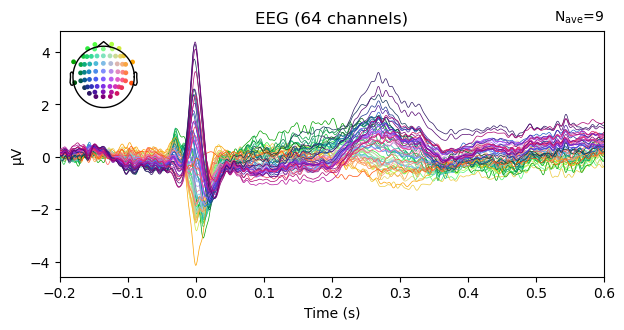

In [46]:
stress_grand_average = mne.grand_average(evoked_stress)
rest_grand_average = mne.grand_average(evoked_first_rest)

stress_grand_average.plot()
rest_grand_average.plot()

In [47]:
concatenate_stress = mne.concatenate_epochs(epochs_stress_list)
concatenate_rest = mne.concatenate_epochs(epochs_first_rest_list)

C:\Users\jeje_\AppData\Local\Temp\ipykernel_6676\1413174694.py:1: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenate_stress = mne.concatenate_epochs(epochs_stress_list)


Not setting metadata
2607 matching events found
Applying baseline correction (mode: mean)
Not setting metadata


C:\Users\jeje_\AppData\Local\Temp\ipykernel_6676\1413174694.py:2: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenate_rest = mne.concatenate_epochs(epochs_first_rest_list)


1947 matching events found
Applying baseline correction (mode: mean)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


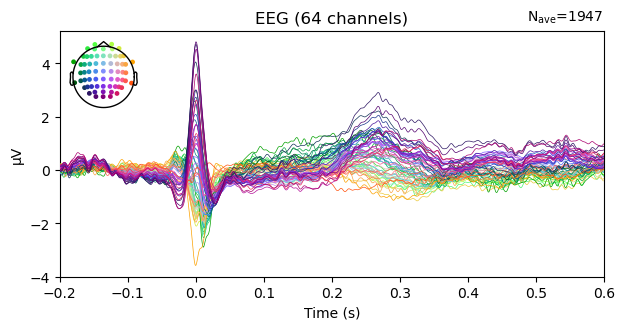

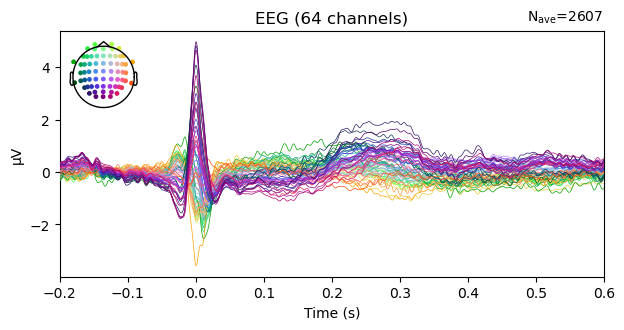

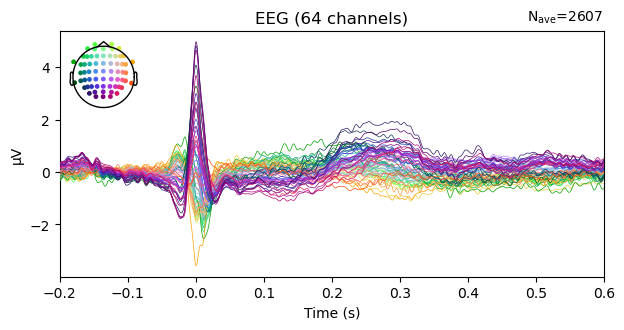

In [48]:
evoked_first_rest1 = concatenate_rest.average()
evoked_stress1 = concatenate_stress.average()

evoked_first_rest1.plot()
evoked_stress1.plot()

In [49]:
concatenate_rest_data = concatenate_rest.get_data()
concatenate_stress_data = concatenate_stress.get_data()

In [50]:
from scipy.stats import ttest_ind

t_test_ga = ttest_ind(concatenate_rest_data,concatenate_stress_data)

In [51]:
stress_grand_average_data = stress_grand_average.get_data()
rest_grand_average_data = rest_grand_average.get_data()


In [30]:
np.shape(t_test_ga.pvalue)

(64, 801)

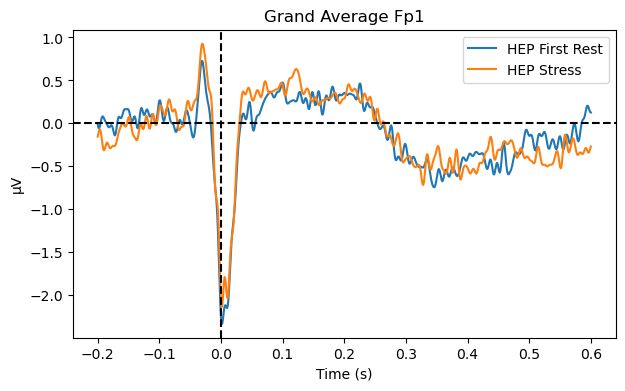

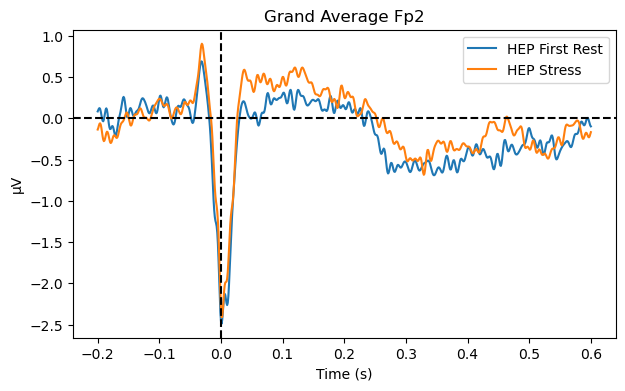

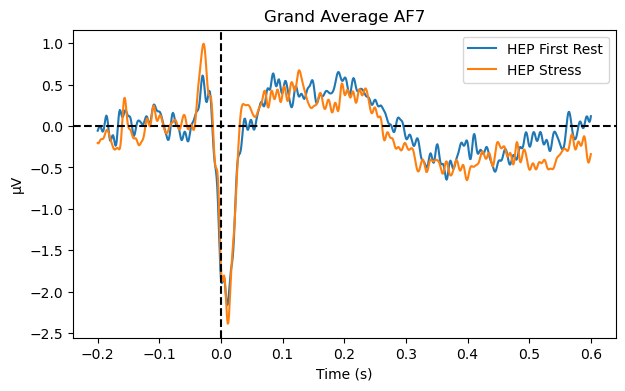

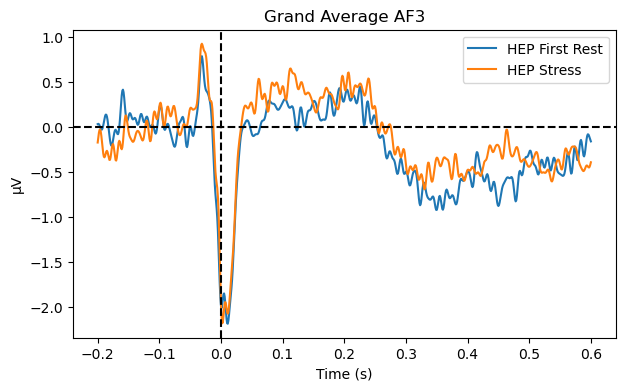

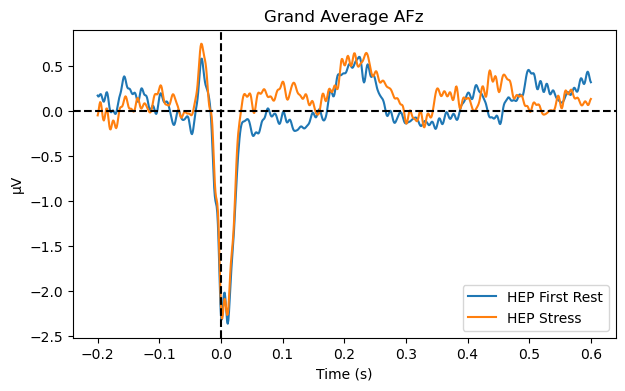

...

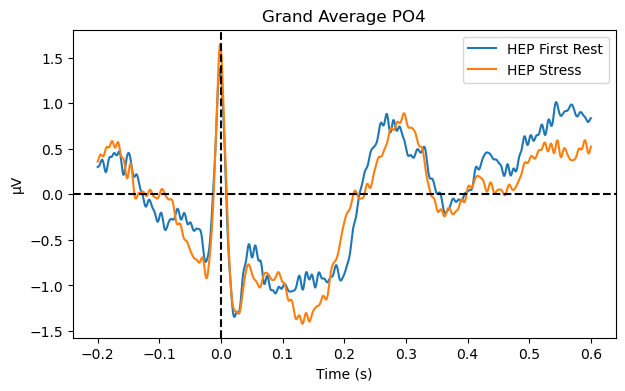

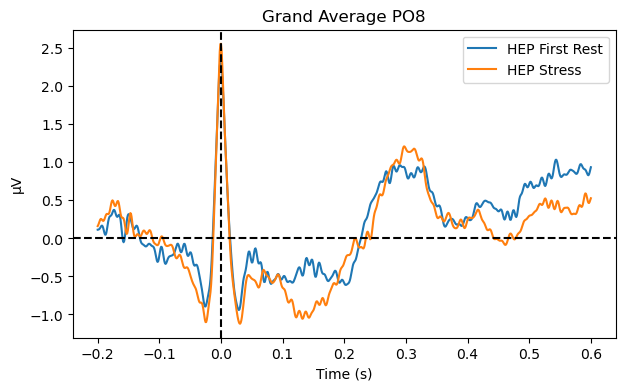

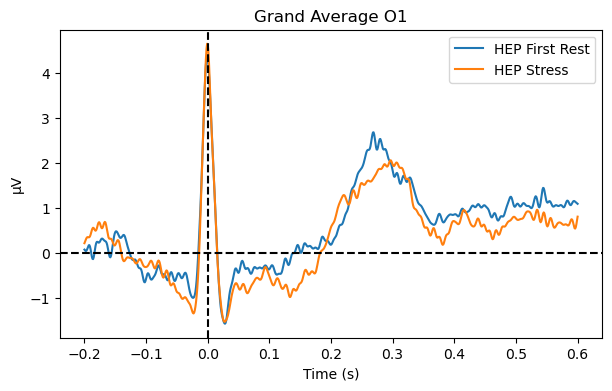

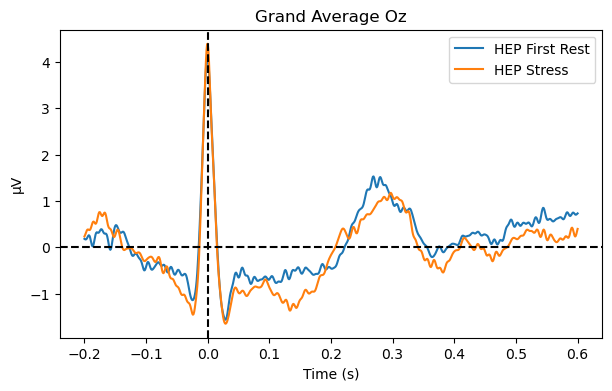

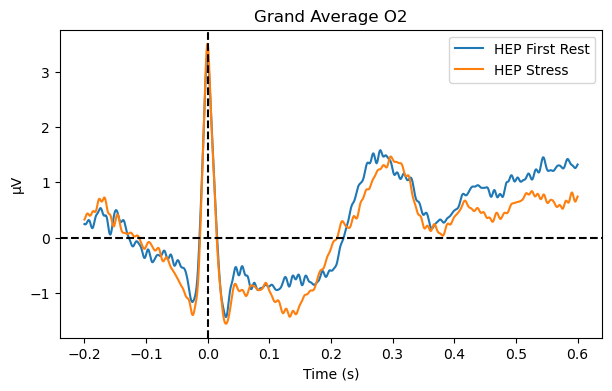

In [52]:
ch_name = stress_grand_average.ch_names
diff = rest_grand_average_data - stress_grand_average_data
step = 1/1000
epoch_tmin = -0.2
epoch_tmax = 0.6
time = np.arange(epoch_tmin, epoch_tmax+step, step)

for j in range(len(ch_name)):
    a = ch_name[j]

    plt.figure(figsize= (7,4))
    plt.plot(time,rest_grand_average_data[j] * 1e6, label = 'HEP First Rest')
    plt.plot(time,stress_grand_average_data[j]* 1e6, label = 'HEP Stress')
    # plt.plot(time,diff[j]* 1e6, label = 'HEP Diference')
    # for i in range(len(t_test_ga.pvalue[j])):
    #     if t_test_ga.pvalue[j][i] <= 0.01:
    #         plt.axvline(x = (i*step)+epoch_tmin, ymin = 0 , ymax = 1, alpha = 0.3)
    plt.axvline(0, linestyle = '--', c = 'black')
    plt.axhline(0, linestyle = '--', c = 'black')
    plt.ylabel('μV')
    plt.xlabel('Time (s)')
    plt.legend()
    plt.title('Grand Average '+ a)
    plt.show()

# Amplitude Reject Epochs

In [50]:
drop = dict(eeg = 100e-6)
epochs_stress_list_dropped = [epo.drop_bad(reject = drop) for epo in epochs_stress_list]
epochs_first_rest_list_dropped = [epo.drop_bad(reject = drop) for epo in epochs_first_rest_list]

0 bad epochs dropped
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Reje

In [56]:
evoked_stress_dropped = [epo.average() for epo in epochs_stress_list_dropped]
evoked_first_rest_dropped = [epo.average() for epo in epochs_first_rest_list_dropped]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy functi

Identifying common channels ...
Identifying common channels ...


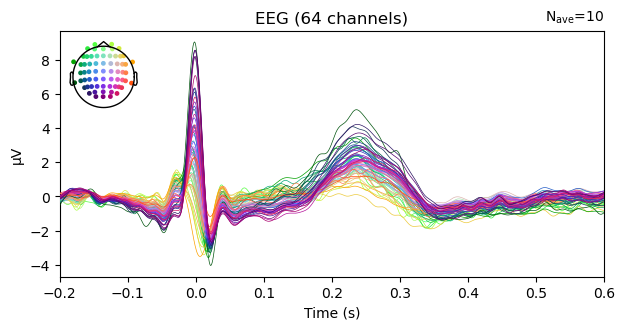

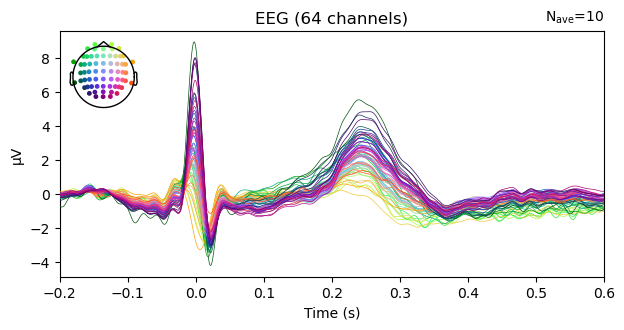

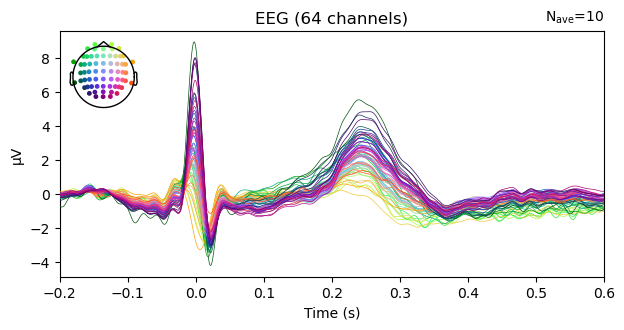

In [58]:
stress_grand_average_dropped = mne.grand_average(evoked_stress_dropped)
rest_grand_average_dropped = mne.grand_average(evoked_first_rest_dropped)

stress_grand_average_dropped.plot()
rest_grand_average_dropped.plot()

In [61]:
concatenate_stress_dropped = mne.concatenate_epochs(epochs_stress_list_dropped)
concatenate_rest_dropped = mne.concatenate_epochs(epochs_first_rest_list_dropped)

C:\Users\jeje_\AppData\Local\Temp\ipykernel_36048\4212024427.py:1: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenate_stress_dropped = mne.concatenate_epochs(epochs_stress_list_dropped)


Not setting metadata
2686 matching events found
Applying baseline correction (mode: mean)


C:\Users\jeje_\AppData\Local\Temp\ipykernel_36048\4212024427.py:2: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenate_rest_dropped = mne.concatenate_epochs(epochs_first_rest_list_dropped)


Not setting metadata
2287 matching events found
Applying baseline correction (mode: mean)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


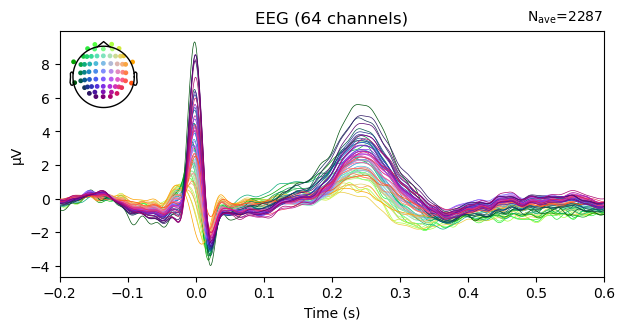

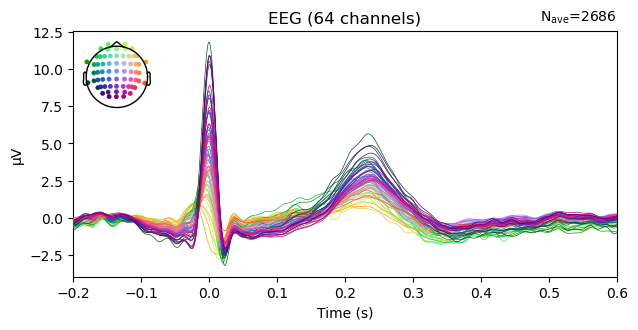

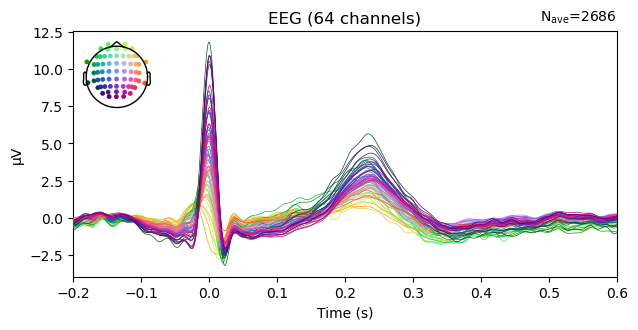

In [62]:
evoked_first_rest1_dropped = concatenate_rest_dropped.average()
evoked_stress1_dropped = concatenate_stress_dropped.average()

evoked_first_rest1_dropped.plot()
evoked_stress1_dropped.plot()

In [63]:
concatenate_rest_data_dropped = concatenate_rest_dropped.get_data()
concatenate_stress_data_dropped = concatenate_stress_dropped.get_data()

# T-Test

In [66]:
from scipy.stats import ttest_ind

t_test_ga_dropped = ttest_ind(concatenate_rest_data_dropped,concatenate_stress_data_dropped)

In [67]:
stress_grand_average_data_dropped = stress_grand_average_dropped.get_data()
rest_grand_average_data_dropped = rest_grand_average_dropped.get_data()


In [72]:
print(t_test_ga_dropped.pvalue)

[[0.43182184 0.44773129 0.47735995 ... 0.17193043 0.1341485  0.10698124]
 [0.45655692 0.51631286 0.59948186 ... 0.0518234  0.03611309 0.02385626]
 [0.29237585 0.32056151 0.3579433  ... 0.08676833 0.08417606 0.08471774]
 ...
 [0.54131564 0.60331102 0.68731664 ... 0.13266521 0.13344841 0.13693412]
 [0.50506377 0.58356174 0.67745365 ... 0.08238177 0.07908413 0.07766383]
 [0.71906898 0.84336894 0.97171596 ... 0.50126065 0.47850151 0.45997478]]


## T-test Plot

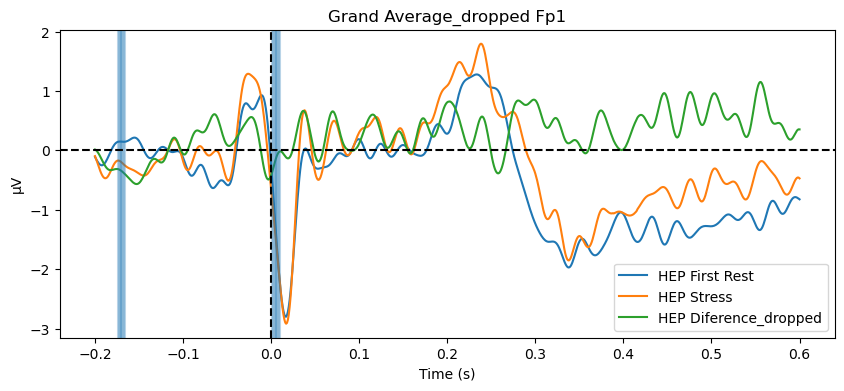

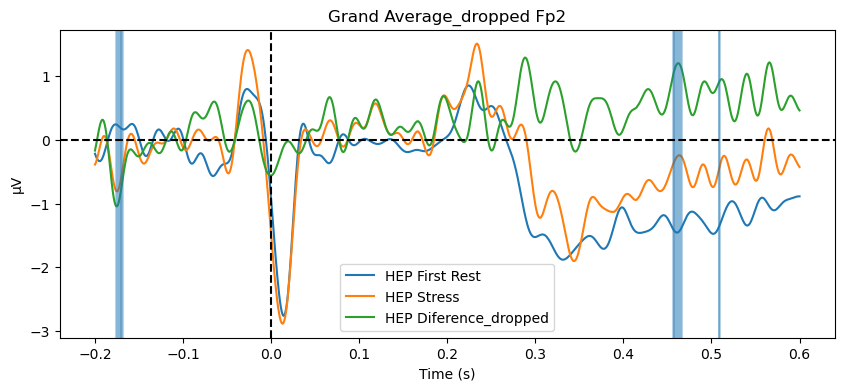

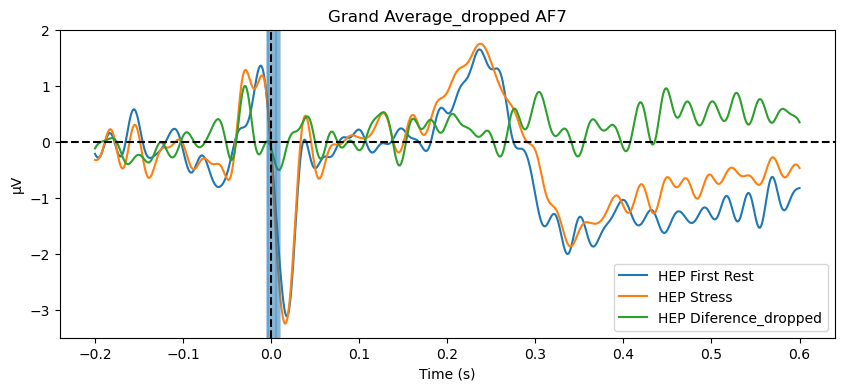

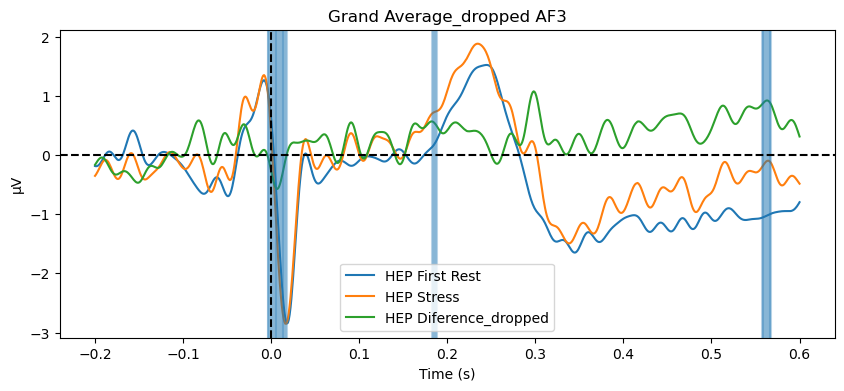

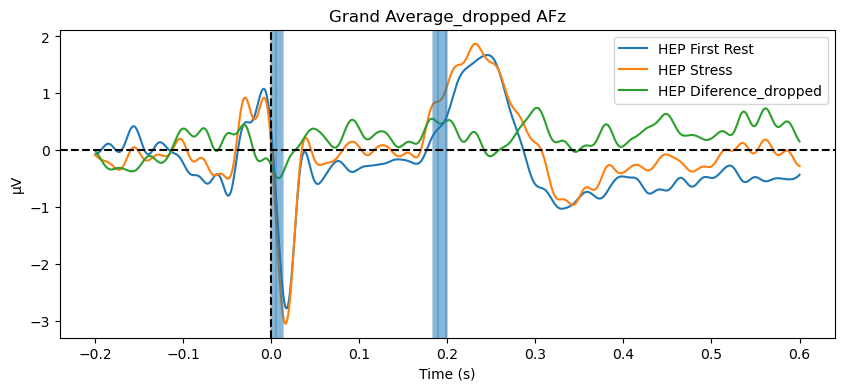

...

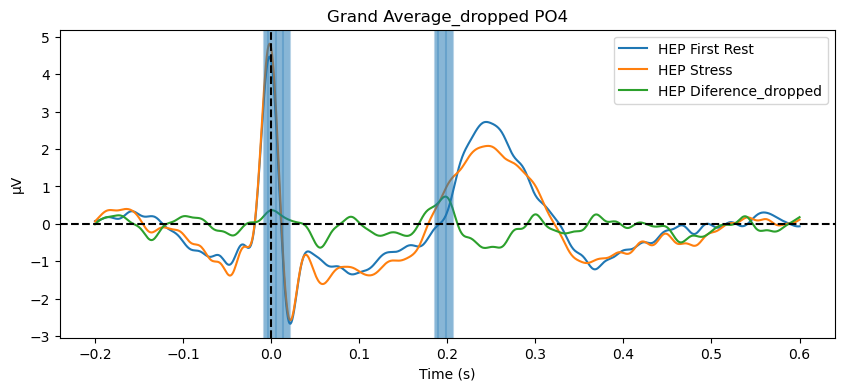

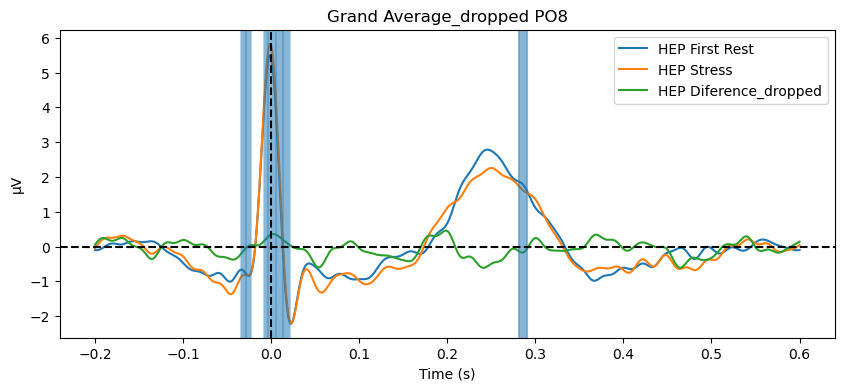

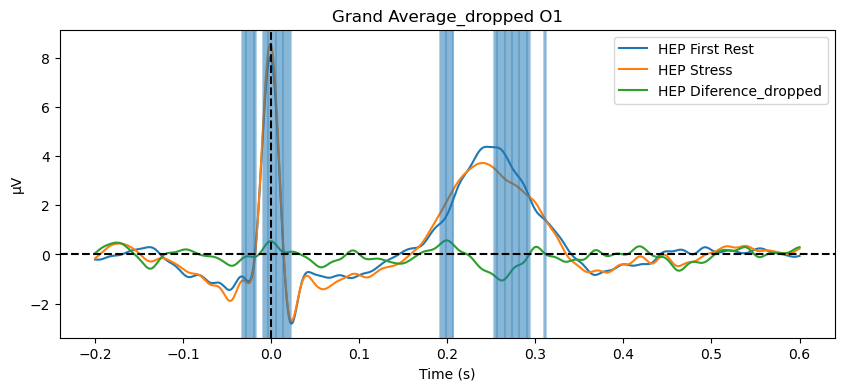

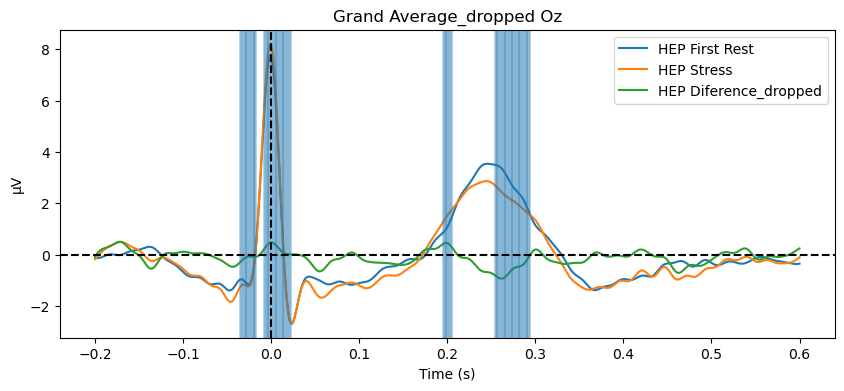

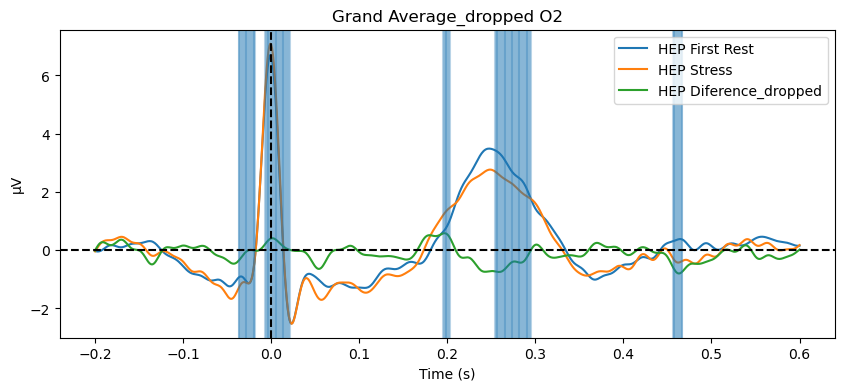

In [71]:
ch_name = stress_grand_average_dropped.ch_names
diff_dropped = stress_grand_average_data_dropped - rest_grand_average_data_dropped
step = 1/1000
epoch_tmin = -0.2
epoch_tmax = 0.6
time = np.arange(epoch_tmin, epoch_tmax+step, step)

for j in range(len(ch_name)):
    a = ch_name[j]

    plt.figure(figsize= (10,4))
    plt.plot(time,rest_grand_average_data_dropped[j] * 1e6, label = 'HEP First Rest')
    plt.plot(time,stress_grand_average_data_dropped[j]* 1e6, label = 'HEP Stress')
    plt.plot(time,diff_dropped[j]* 1e6, label = 'HEP Diference_dropped')
    for i in range(len(t_test_ga_dropped.pvalue[j])):
        if t_test_ga_dropped.pvalue[j][i] <= 0.01:
            plt.axvline(x = (i*step)+epoch_tmin, ymin = 0 , ymax = 1, alpha = 0.3)
    plt.axvline(0, linestyle = '--', c = 'black')
    plt.axhline(0, linestyle = '--', c = 'black')
    plt.ylabel('μV')
    plt.xlabel('Time (s)')
    plt.legend()
    plt.title('Grand Average_dropped '+ a)
    plt.show()

# Individual Epoch Check

In [61]:
print(epochs_stress_list)

[<EpochsFIF |  323 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~126.4 MB, data loaded,
 '7': 323>, <EpochsFIF |  69 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~27.1 MB, data loaded,
 '7': 69>, <EpochsFIF |  269 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~105.3 MB, data loaded,
 '7': 269>, <EpochsFIF |  112 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~43.9 MB, data loaded,
 '7': 112>, <EpochsFIF |  266 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~104.1 MB, data loaded,
 '7': 266>, <EpochsFIF |  109 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~42.7 MB, data loaded,
 '7': 109>, <EpochsFIF |  447 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~174.9 MB, data loaded,
 '7': 447>, <EpochsFIF |  176 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~68.9 MB, data loaded,
 '7': 176>, <EpochsFIF |  760 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~297.3 MB, data loaded,
 '7': 760>, <EpochsFIF |  155 events (all goo

In [62]:
def check_epoch(file_num):
    return(epochs_first_rest_list[file_num], epochs_stress_list[file_num])

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


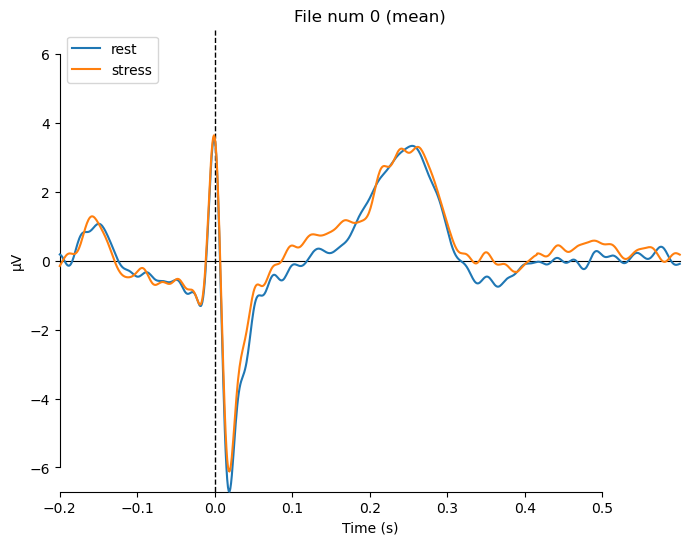

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


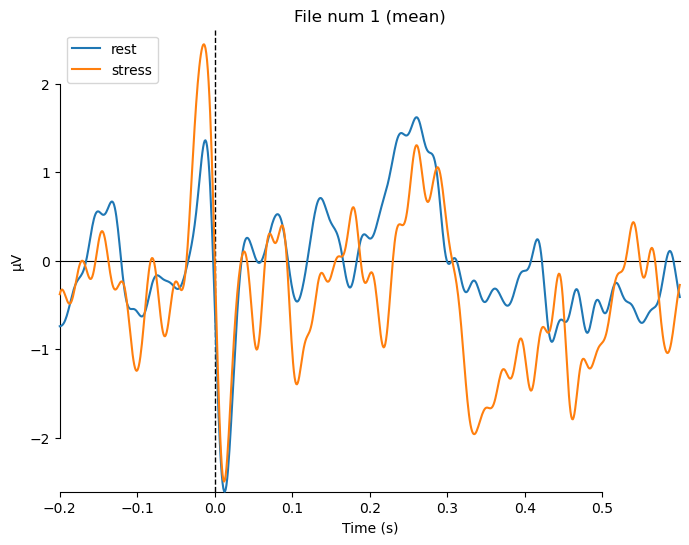

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


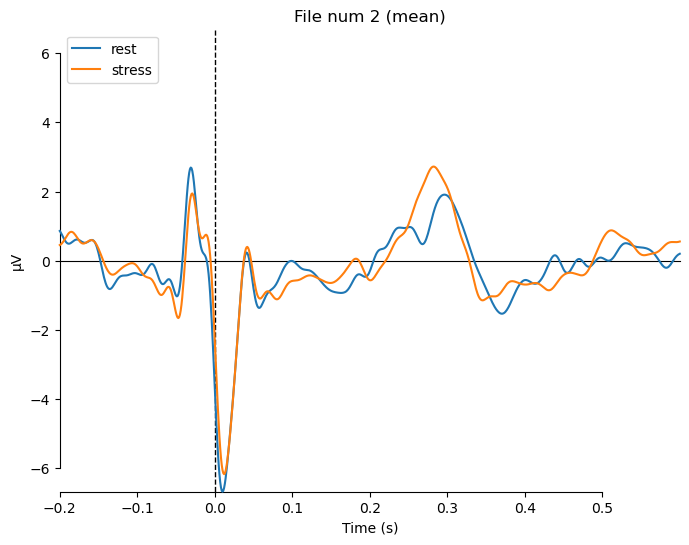

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


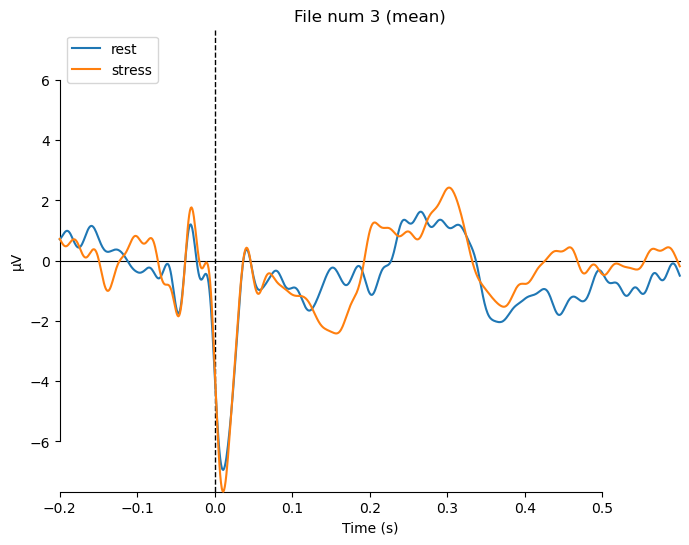

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


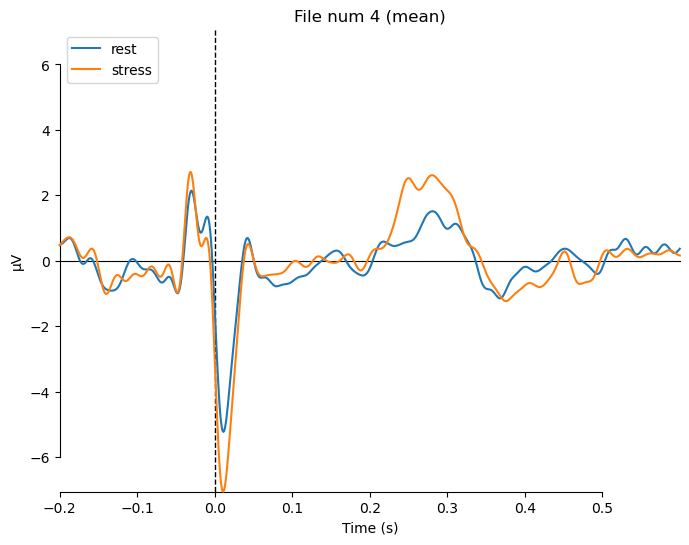

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


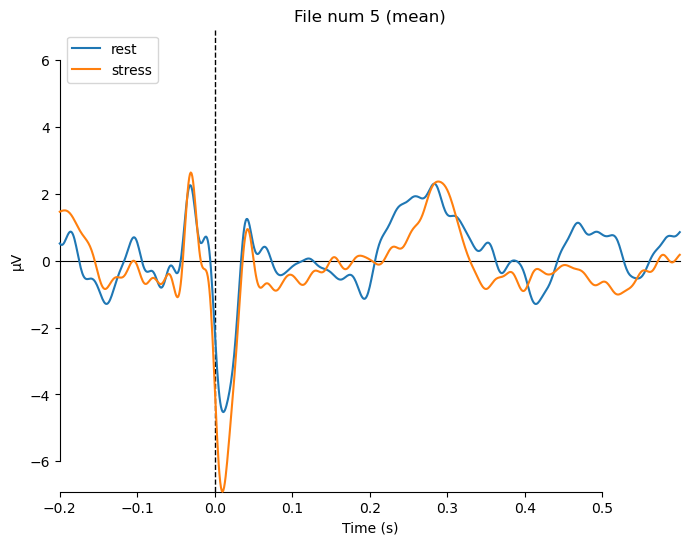

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


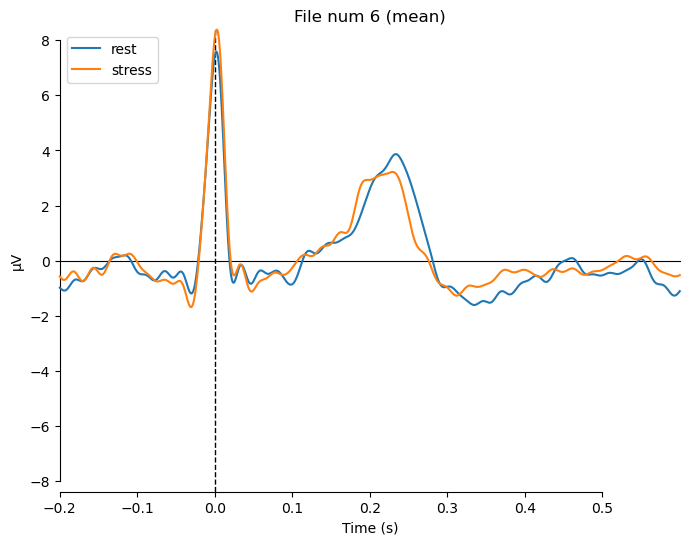

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


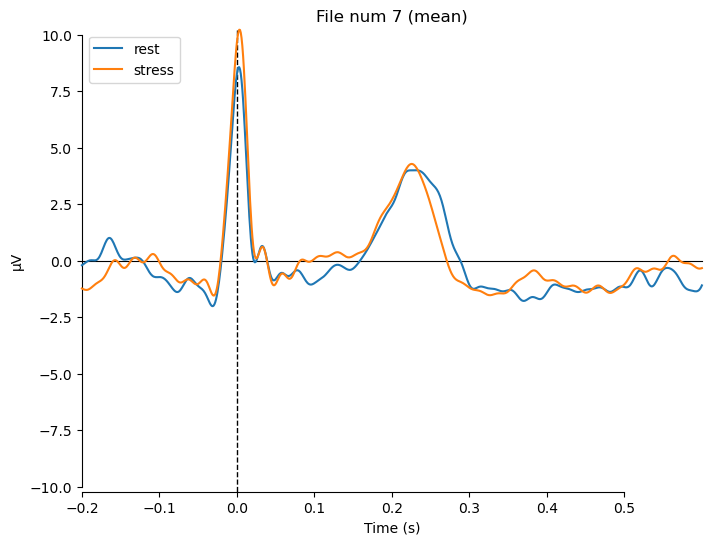

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


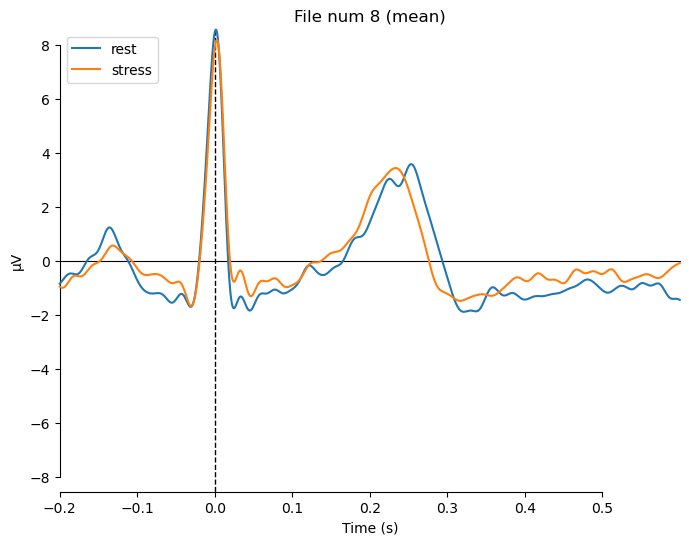

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


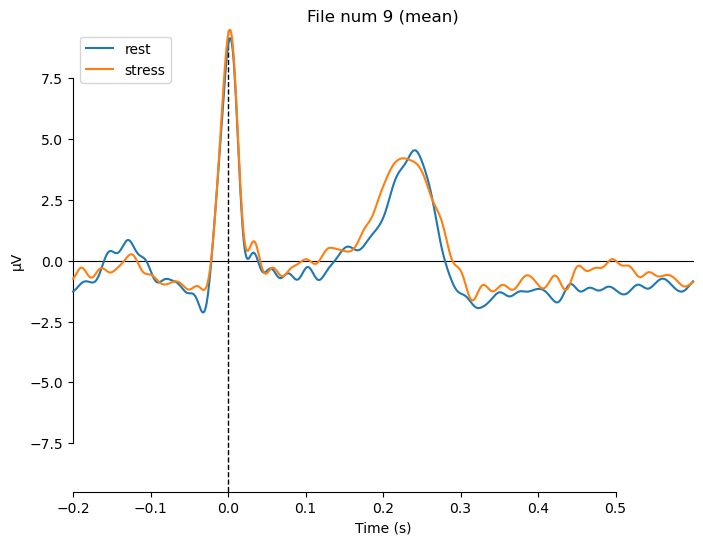

In [84]:
for i in range(len(epochs_first_rest_list)):
    rest_epo,stress_epo = check_epoch(i)
    rest_evoked = rest_epo.average()
    stress_evoked = stress_epo.average()

    evokdes = dict(rest = rest_evoked , stress = stress_evoked)
    mne.viz.plot_compare_evokeds(evokdes, combine='mean',title = f'File num {i}')

In [81]:
rest_epo.info

<Info | 10 non-empty values
 bads: []
 ch_names: Fp1, Fp2, AF7, AF3, AFz, AF4, AF8, F7, F5, F3, F1, Fz, F2, F4, ...
 chs: 64 EEG
 custom_ref_applied: False
 dig: 67 items (3 Cardinal, 64 EEG)
 file_id: 4 items (dict)
 highpass: 1.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2023-10-19 10:08:22 UTC
 meas_id: 4 items (dict)
 nchan: 64
 projs: []
 sfreq: 1000.0 Hz
>

In [82]:
rest_epo.info

<Info | 10 non-empty values
 bads: []
 ch_names: Fp1, Fp2, AF7, AF3, AFz, AF4, AF8, F7, F5, F3, F1, Fz, F2, F4, ...
 chs: 64 EEG
 custom_ref_applied: False
 dig: 67 items (3 Cardinal, 64 EEG)
 file_id: 4 items (dict)
 highpass: 1.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2023-10-19 10:08:22 UTC
 meas_id: 4 items (dict)
 nchan: 64
 projs: []
 sfreq: 1000.0 Hz
>

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


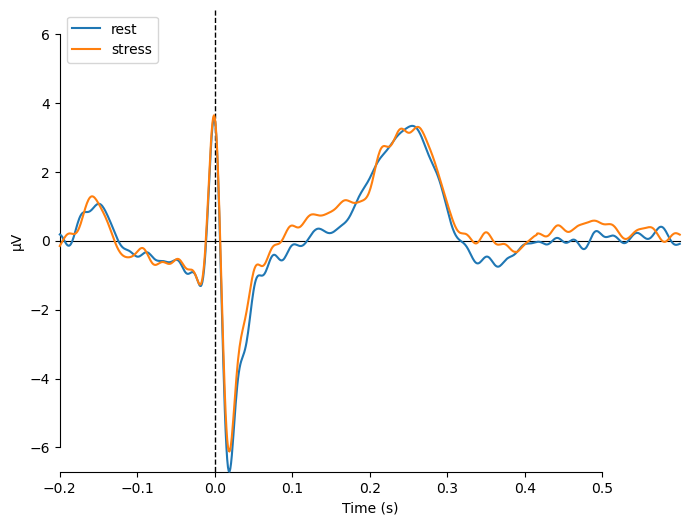

[<Figure size 800x600 with 1 Axes>]

In [83]:
rest_evoked = rest_epo.average()
stress_evoked = stress_epo.average()

evokdes = dict(rest = rest_evoked , stress = stress_evoked)
mne.viz.plot_compare_evokeds(evokdes, combine='mean',)

# Other

In [46]:
index = np.where(t_test_ga.pvalue[ch_name.index('FCz')] <= 0.05) 
index = np.array(index)
for i in range(len(index)):
    index[i] -= 200
print(index)

time_stamp = index*step
print(time_stamp)

print(t_test_ga.pvalue[ch_name.index('FCz')][np.where(t_test_ga.pvalue[ch_name.index('FCz')] <= 0.05)])

[[171 172 173 174 175 214 215 216 217 218 219 220 221 222 223 224 225 226
  227 228 229 230 231 232 233 234 235 236 268 269 270 271 272 273 274 275
  276 277 278 279 280 281 282 283 284 285 286 287 288 289 290 291 292 293
  294 295 296 297 298 299 300 301 302 303 304 305 306 307 308 309 310 311
  312 313]]
[[0.171 0.172 0.173 0.174 0.175 0.214 0.215 0.216 0.217 0.218 0.219 0.22
  0.221 0.222 0.223 0.224 0.225 0.226 0.227 0.228 0.229 0.23  0.231 0.232
  0.233 0.234 0.235 0.236 0.268 0.269 0.27  0.271 0.272 0.273 0.274 0.275
  0.276 0.277 0.278 0.279 0.28  0.281 0.282 0.283 0.284 0.285 0.286 0.287
  0.288 0.289 0.29  0.291 0.292 0.293 0.294 0.295 0.296 0.297 0.298 0.299
  0.3   0.301 0.302 0.303 0.304 0.305 0.306 0.307 0.308 0.309 0.31  0.311
  0.312 0.313]]
[4.85295659e-02 3.97184710e-02 3.58168637e-02 3.61159274e-02
 4.09314760e-02 4.74076472e-02 4.23984203e-02 3.96342979e-02
 3.85762722e-02 3.88094880e-02 3.99756605e-02 4.17204337e-02
 4.36681622e-02 4.54296853e-02 4.66438416e-02 4.70

In [49]:
print(t_test_ga.pvalue[ch_name.index('FCz')][468:513])

[3.22410910e-02 1.70621279e-02 8.50234870e-03 4.06810902e-03
 1.91832877e-03 9.19534298e-04 4.62975777e-04 2.52537807e-04
 1.53079118e-04 1.04881193e-04 8.18056237e-05 7.24742455e-05
 7.21842860e-05 7.95325796e-05 9.50213251e-05 1.20423892e-04
 1.58307974e-04 2.11281755e-04 2.80713163e-04 3.65004368e-04
 4.57956502e-04 5.48585471e-04 6.23359677e-04 6.70265255e-04
 6.82938449e-04 6.62901005e-04 6.18601306e-04 5.61883712e-04
 5.04259244e-04 4.54764256e-04 4.19602792e-04 4.03077076e-04
 4.09476436e-04 4.45395229e-04 5.22688956e-04 6.63027129e-04
 9.05455407e-04 1.31909907e-03 2.02294104e-03 3.21278381e-03
 5.19040877e-03 8.38254174e-03 1.33288457e-02 2.06181986e-02
 3.07712941e-02]
